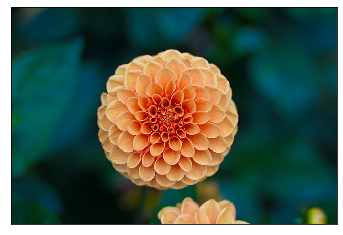

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_sample_image

img = load_sample_image("flower.jpg")
ax = plt.axes(xticks=[], yticks=[])
ax.imshow(img)

In [4]:
img.shape

(427, 640, 3)

In [7]:
data = img / 255.0
data = data.reshape(427*640, 3)
data.shape

(273280, 3)

In [8]:
data

array([[0.00784314, 0.0745098 , 0.05098039],
       [0.01176471, 0.07058824, 0.05098039],
       [0.02745098, 0.07843137, 0.05098039],
       ...,
       [0.02745098, 0.18039216, 0.10980392],
       [0.03137255, 0.17647059, 0.10980392],
       [0.03529412, 0.16862745, 0.10588235]])

In [15]:
def plot_pixel(data, title, colors=None, N=10000):
    if colors is None:
        colors = data

    rand_state = np.random.RandomState(0)
    i = rand_state.permutation(data.shape[0])[:N]
    colors = colors[i]
    R, G, B = data[i].T

    fig, ax = plt.subplots(1, 2, figsize=(16,6))

    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlim=(0,1), ylim=(0,1))

    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlim=(0,1), ylim=(0,1))

    fig.suptitle(title, size=20)


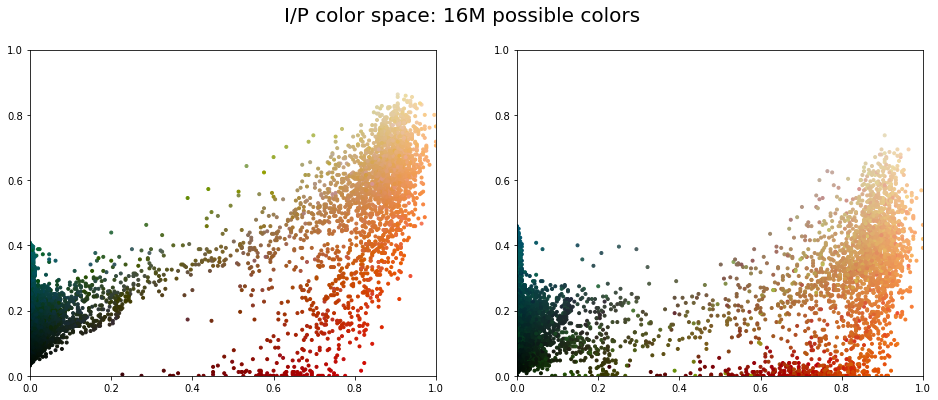

In [16]:
plot_pixel(data, title='I/P color space: 16M possible colors')

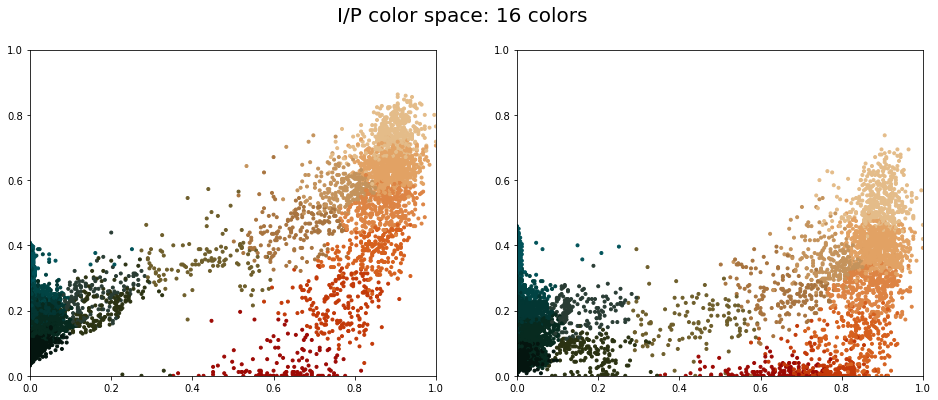

In [18]:
import warnings; warnings.simplefilter('ignore')

from sklearn.cluster import MiniBatchKMeans

kmeans = MiniBatchKMeans(16)
kmeans.fit(data)
new_colors = kmeans.cluster_centers_[kmeans.predict(data)]

plot_pixel(data, colors=new_colors, title='I/P color space: 16 colors')


Text(0.5, 1.0, '16-color image')

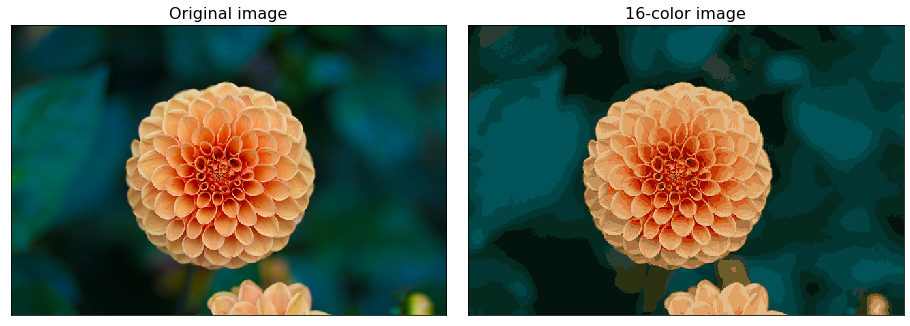

In [19]:
img_recolored = new_colors.reshape(img.shape)

fig, ax = plt.subplots(1, 2, figsize=(16,6), subplot_kw=dict(xticks=[], yticks=[]))

fig.subplots_adjust(wspace=0.05)
ax[0].imshow(img)
ax[0].set_title('Original image', size=16)
ax[1].imshow(img_recolored)
ax[1].set_title('16-color image', size=16)

In [20]:
##Example 2

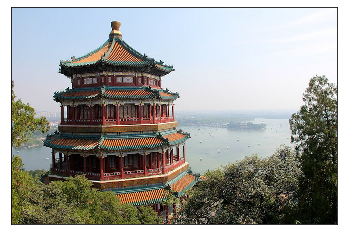

In [23]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_sample_image

img1 = load_sample_image("china.jpg")
ax = plt.axes(xticks=[], yticks=[])
ax.imshow(img1)

In [25]:
data1 = img1 / 255.0
data1 = data1.reshape(427*640, 3)
data1.shape

(273280, 3)

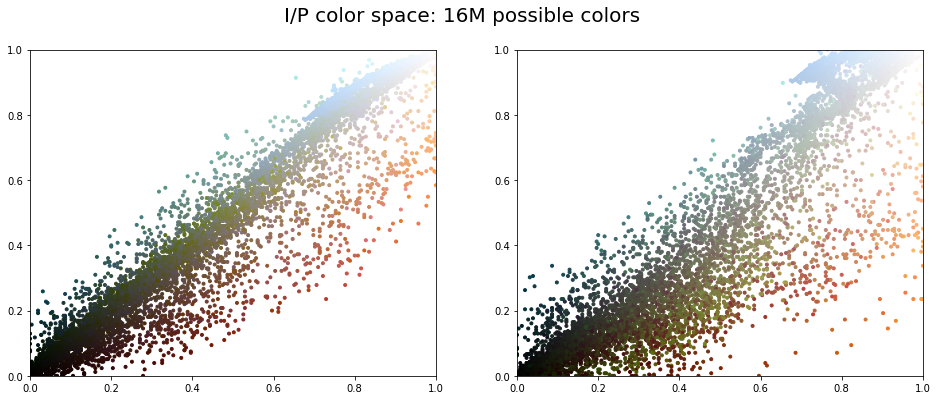

In [26]:
plot_pixel(data1, title='I/P color space: 16M possible colors')

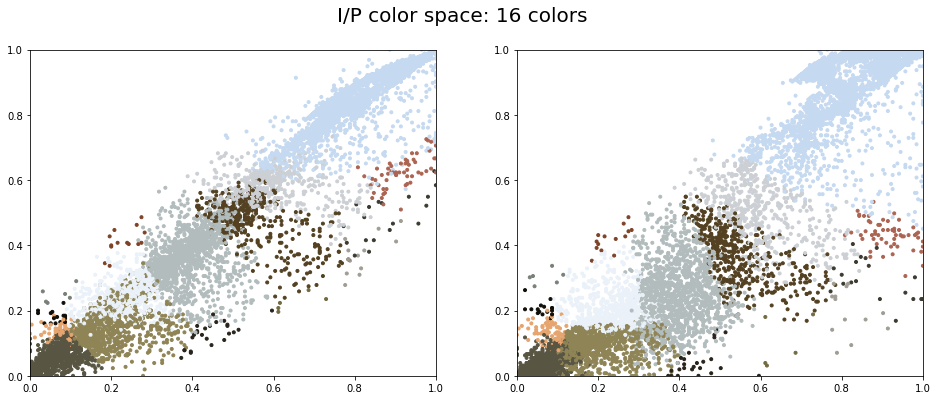

In [27]:
kmeans_ = MiniBatchKMeans(16)
kmeans_.fit(data1)
new_colors = kmeans_.cluster_centers_[kmeans.predict(data1)]

plot_pixel(data1, colors=new_colors, title='I/P color space: 16 colors')

Text(0.5, 1.0, '16-color image')

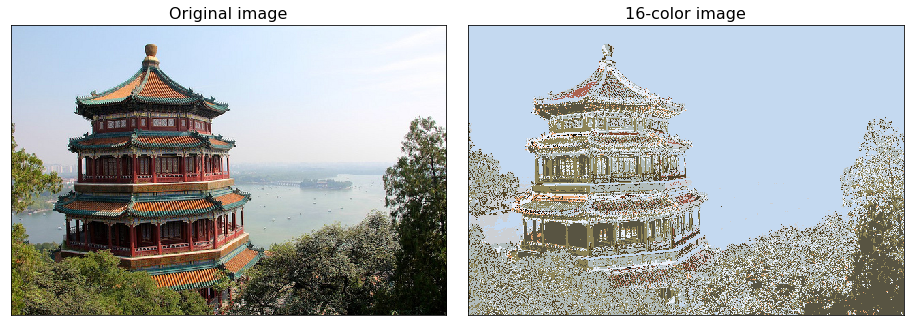

In [28]:
img_recolored1 = new_colors.reshape(img1.shape)

fig, ax = plt.subplots(1, 2, figsize=(16,6), subplot_kw=dict(xticks=[], yticks=[]))

fig.subplots_adjust(wspace=0.05)
ax[0].imshow(img1)
ax[0].set_title('Original image', size=16)
ax[1].imshow(img_recolored1)
ax[1].set_title('16-color image', size=16)